In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
import pickle

In [2]:
student = pd.read_csv("student.csv")

In [3]:
student.head()

,Unnamed: 0,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,0,GP,F,18,U,GT3,A,4,4,at_home,...,4,3,4,1,1,3,6,5,6,6
1,1,GP,F,17,U,GT3,T,1,1,at_home,...,5,3,3,1,1,3,4,5,5,6
2,2,GP,F,15,U,LE3,T,1,1,at_home,...,4,3,2,2,3,3,10,7,8,10
3,3,GP,F,15,U,GT3,T,4,2,health,...,3,2,2,1,1,5,2,15,14,15
4,4,GP,F,16,U,GT3,T,3,3,other,...,4,3,2,1,2,5,4,6,10,10


In [4]:
student.describe(include='all')

,Unnamed: 0,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,1044.000000,1044,1044,1044.000000,1044,1044,1044,1044.000000,1044.000000,1044,...,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000
unique,NaN,2,2,NaN,2,2,2,NaN,NaN,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,GP,F,NaN,U,GT3,T,NaN,NaN,other,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,772,591,NaN,759,738,923,NaN,NaN,399,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,275.949234,NaN,NaN,16.726054,NaN,NaN,NaN,2.603448,2.387931,NaN,...,3.935824,3.201149,3.156130,1.494253,2.284483,3.543103,4.434866,11.213602,11.246169,11.341954
std,174.819941,NaN,NaN,1.239975,NaN,NaN,NaN,1.124907,1.099938,NaN,...,0.933401,1.031507,1.152575,0.911714,1.285105,1.424703,6.210017,2.983394,3.285071,3.864796
min,0.000000,NaN,NaN,15.000000,NaN,NaN,NaN,0.000000,0.000000,NaN,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,130.000000,NaN,NaN,16.000000,NaN,NaN,NaN,2.000000,1.000000,NaN,...,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,9.000000,9.000000,10.000000
50%,260.500000,NaN,NaN,17.000000,NaN,NaN,NaN,3.000000,2.000000,NaN,...,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,2.000000,11.000000,11.000000,11.000000
75%,391.000000,NaN,NaN,18.000000,NaN,NaN,NaN,4.000000,3.000000,NaN,...,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,6.000000,13.000000,13.000000,14.000000


In [5]:
student.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1044 entries, 0 to 1043
Data columns (total 34 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  1044 non-null   int64 
 1   school      1044 non-null   object
 2   sex         1044 non-null   object
 3   age         1044 non-null   int64 
 4   address     1044 non-null   object
 5   famsize     1044 non-null   object
 6   Pstatus     1044 non-null   object
 7   Medu        1044 non-null   int64 
 8   Fedu        1044 non-null   int64 
 9   Mjob        1044 non-null   object
 10  Fjob        1044 non-null   object
 11  reason      1044 non-null   object
 12  guardian    1044 non-null   object
 13  traveltime  1044 non-null   int64 
 14  studytime   1044 non-null   int64 
 15  failures    1044 non-null   int64 
 16  schoolsup   1044 non-null   object
 17  famsup      1044 non-null   object
 18  paid        1044 non-null   object
 19  activities  1044 non-null   object
 20  nursery 

#### TRANSFORMATION

In [6]:
#create a new column which is an average of the previous scores
student["G4"] = round((student["G1"] + student["G2"] + student["G3"]) / 3, 0)

In [7]:
student.head()

,Unnamed: 0,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,...,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,G4
0,0,GP,F,18,U,GT3,A,4,4,at_home,...,3,4,1,1,3,6,5,6,6,6.0
1,1,GP,F,17,U,GT3,T,1,1,at_home,...,3,3,1,1,3,4,5,5,6,5.0
2,2,GP,F,15,U,LE3,T,1,1,at_home,...,3,2,2,3,3,10,7,8,10,8.0
3,3,GP,F,15,U,GT3,T,4,2,health,...,2,2,1,1,5,2,15,14,15,15.0
4,4,GP,F,16,U,GT3,T,3,3,other,...,3,2,1,2,5,4,6,10,10,9.0


In [8]:
student["guardian"].unique()

array(['mother', 'father', 'other'], dtype=object)

<AxesSubplot:xlabel='G4', ylabel='Count'>

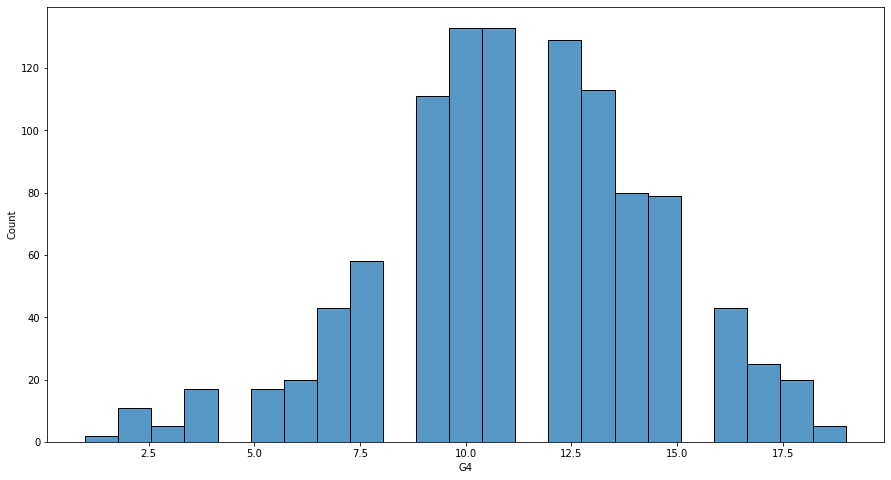

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(15, 8))
sns.histplot(student["G4"])

In [10]:
student["sex"].dtype == np.dtype('O')

True

In [11]:
student = student.drop(["Unnamed: 0"], axis = 1)

In [12]:
new_student = pd.DataFrame()
encoders = {}

for col in student.columns:
    if student[col].dtype == np.dtype('O'):
        lab = LabelEncoder()
        res = lab.fit_transform(student[col])
        new_student[col] = res
        encoders[col] = lab
    else:
        new_student[col] = student[col]

In [13]:
for k,v in encoders.items():
    pickle.dump(v, open(f"{k}.pkl", "wb"))

In [14]:
new_student

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,G4
0,0,0,18,1,0,0,4,4,0,4,...,3,4,1,1,3,6,5,6,6,6.0
1,0,0,17,1,0,1,1,1,0,2,...,3,3,1,1,3,4,5,5,6,5.0
2,0,0,15,1,1,1,1,1,0,2,...,3,2,2,3,3,10,7,8,10,8.0
3,0,0,15,1,0,1,4,2,1,3,...,2,2,1,1,5,2,15,14,15,15.0
4,0,0,16,1,0,1,3,3,2,2,...,3,2,1,2,5,4,6,10,10,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,1,0,19,0,0,1,2,3,3,2,...,4,2,1,2,5,4,10,11,10,10.0
1040,1,0,18,1,1,1,3,1,4,3,...,3,4,1,1,1,4,15,15,16,15.0
1041,1,0,18,1,0,1,1,1,2,2,...,1,1,1,1,5,6,11,12,9,11.0
1042,1,1,17,1,1,1,3,1,3,3,...,4,5,3,4,2,6,10,10,10,10.0


In [15]:
new_student.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'G3', 'G4'],
      dtype='object')

In [16]:
X = new_student.drop(["G4"], axis=1)
Y = new_student["G4"]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=101)

In [17]:
sc = StandardScaler()

X_trained_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [18]:
rf_1 = RandomForestRegressor()
rf_2 = RandomForestRegressor()

In [19]:
rf_1.fit(X_train, y_train)

RandomForestRegressor()

In [20]:
rf_2.fit(X_trained_scaled, y_train)

RandomForestRegressor()

In [21]:
#plotting first 5 trees of first algorithm
fig, axes = plt.subplots(nrows=1, ncols=5, figsize = (15, 8), dpi=900)
for i in range(5):
    plot_tree(
        rf_1.estimators_[i],
        feature_names=rf_1.feature_names_in_,
        class_names=["G4"],
        filled=True,
        ax=axes[i]
    )

In [22]:
#plotting first 5 trees of second algorithm
fig, axes = plt.subplots(nrows=1, ncols=5, figsize = (15, 8), dpi=900)
for i in range(5):
    plot_tree(
        rf_2.estimators_[i],
        feature_names=rf_1.feature_names_in_,
        class_names=["G4"],
        filled=True,
        ax=axes[i]
    )

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize = (15, 8), dpi=900)
plot_tree(
        rf_2.estimators_[0],
        feature_names=rf_1.feature_names_in_,
        class_names=["G4"],
        filled=True
    )

[Text(0.475, 0.9583333333333334, 'G2 <= 0.04\nsquared_error = 10.394\nsamples = 530\nvalue = 11.541'),
 Text(0.19114583333333332, 0.875, 'G3 <= -1.049\nsquared_error = 4.685\nsamples = 262\nvalue = 9.007'),
 Text(0.065625, 0.7916666666666666, 'G2 <= -2.751\nsquared_error = 2.065\nsamples = 45\nvalue = 5.07'),
 Text(0.016666666666666666, 0.7083333333333334, 'Mjob <= -0.873\nsquared_error = 0.43\nsamples = 8\nvalue = 2.545'),
 Text(0.008333333333333333, 0.625, 'squared_error = 0.0\nsamples = 4\nvalue = 3.0'),
 Text(0.025, 0.625, 'Fedu <= 0.093\nsquared_error = 0.188\nsamples = 4\nvalue = 1.75'),
 Text(0.016666666666666666, 0.5416666666666666, 'squared_error = 0.0\nsamples = 3\nvalue = 2.0'),
 Text(0.03333333333333333, 0.5416666666666666, 'squared_error = 0.0\nsamples = 1\nvalue = 1.0'),
 Text(0.11458333333333333, 0.7083333333333334, 'G3 <= -1.576\nsquared_error = 0.982\nsamples = 37\nvalue = 5.533'),
 Text(0.07916666666666666, 0.625, 'G1 <= -1.287\nsquared_error = 0.513\nsamples = 22\nva

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize = (15, 8), dpi=900)
plot_tree(
        rf_1.estimators_[0],
        feature_names=rf_1.feature_names_in_,
        class_names=["G4"],
        filled=True
    )

[Text(0.5154089861751152, 0.9583333333333334, 'G2 <= 11.5\nsquared_error = 10.423\nsamples = 516\nvalue = 11.383'),
 Text(0.2154377880184332, 0.875, 'G3 <= 7.5\nsquared_error = 5.42\nsamples = 271\nvalue = 9.044'),
 Text(0.06797235023041474, 0.7916666666666666, 'G2 <= 2.5\nsquared_error = 3.508\nsamples = 50\nvalue = 4.74'),
 Text(0.027649769585253458, 0.7083333333333334, 'G1 <= 7.5\nsquared_error = 0.554\nsamples = 8\nvalue = 2.158'),
 Text(0.018433179723502304, 0.625, 'G1 <= 4.5\nsquared_error = 0.222\nsamples = 5\nvalue = 1.667'),
 Text(0.009216589861751152, 0.5416666666666666, 'squared_error = 0.0\nsamples = 1\nvalue = 1.0'),
 Text(0.027649769585253458, 0.5416666666666666, 'squared_error = 0.0\nsamples = 4\nvalue = 2.0'),
 Text(0.03686635944700461, 0.625, 'squared_error = 0.0\nsamples = 3\nvalue = 3.0'),
 Text(0.10829493087557604, 0.7083333333333334, 'G3 <= 5.5\nsquared_error = 1.376\nsamples = 42\nvalue = 5.648'),
 Text(0.06912442396313365, 0.625, 'G1 <= 8.5\nsquared_error = 0.823

In [25]:
X_scaled = sc.transform(X)

In [26]:
test_r1 = rf_1.predict(X_test)

test_r2 = rf_2.predict(X_test_scaled)

In [27]:
pred_r1 = rf_1.predict(X)

pred_r2 = rf_2.predict(X_scaled)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Residual Plot for Model 1')

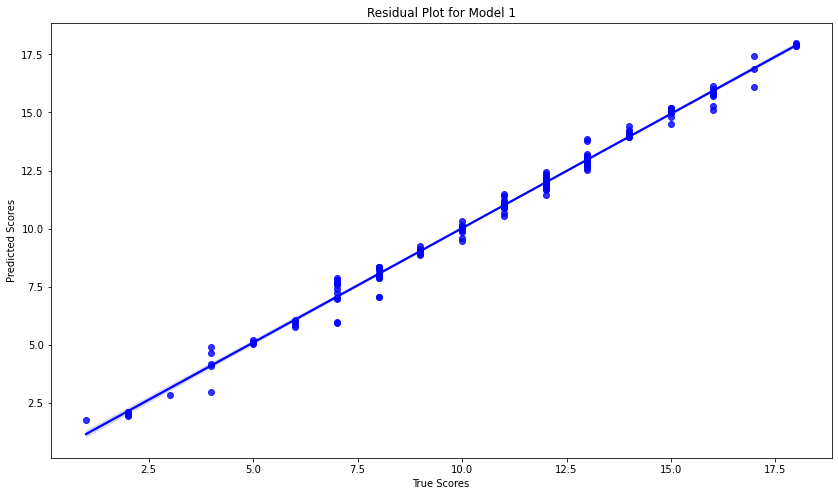

In [28]:
fig = plt.figure(figsize=(14, 8))
sns.regplot(y_test, test_r1, color='blue')
plt.xlabel("True Scores")
plt.ylabel("Predicted Scores")
plt.title("Residual Plot for Model 1")

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Residual Plot for Model 2')

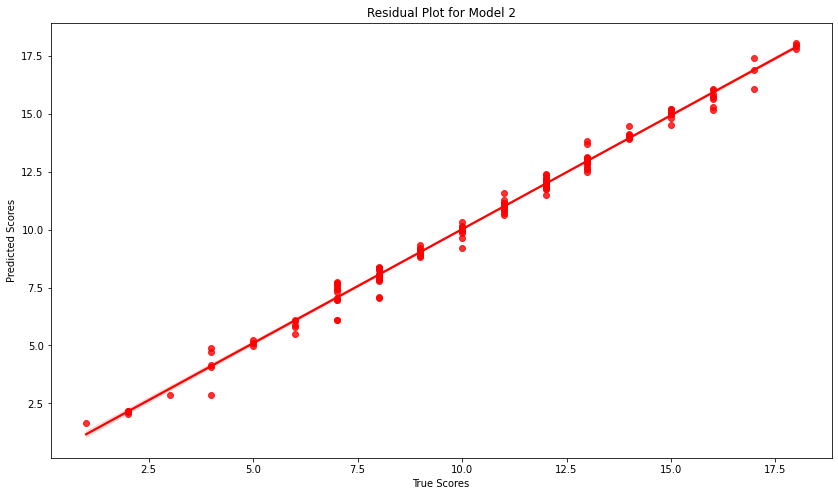

In [29]:
fig = plt.figure(figsize=(14, 8))
sns.regplot(y_test, test_r2, color='red')
plt.xlabel("True Scores")
plt.ylabel("Predicted Scores")
plt.title("Residual Plot for Model 2")

Text(0.5, 1.0, 'Residual Plot for Model 1')

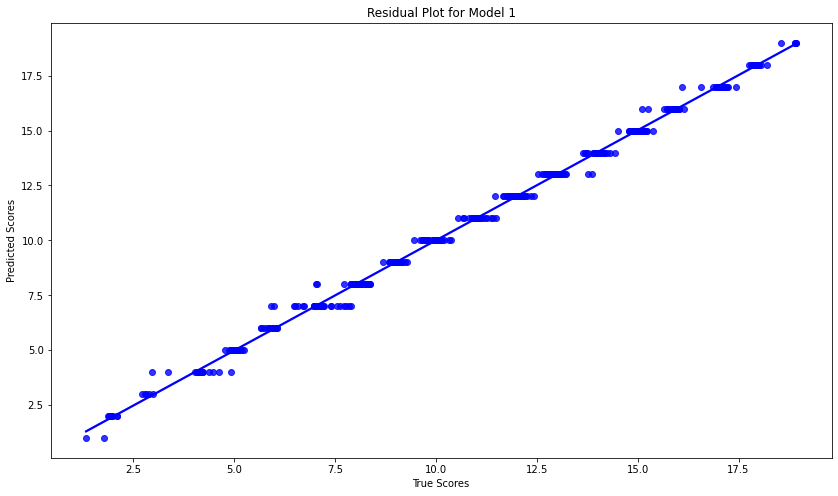

In [30]:
fig = plt.figure(figsize=(14, 8))
sns.regplot(x = pred_r1, y = Y, color='blue')
plt.xlabel("True Scores")
plt.ylabel("Predicted Scores")
plt.title("Residual Plot for Model 1")

Text(0.5, 1.0, 'Residual Plot for Model 2')

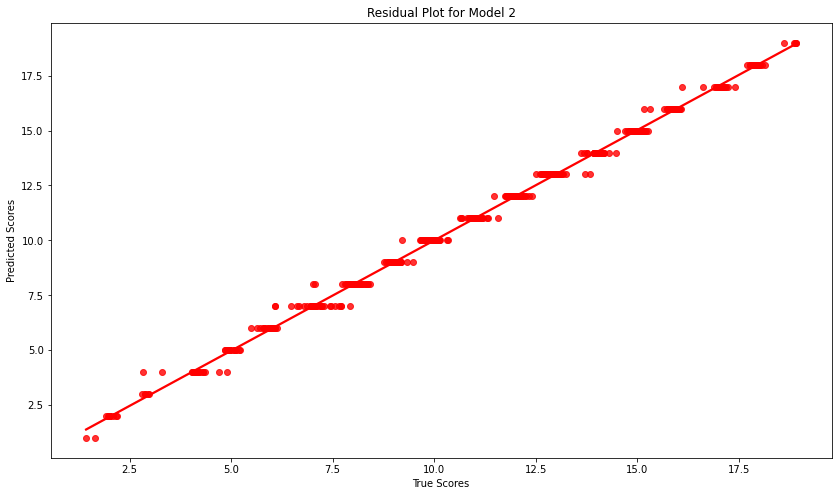

In [31]:
fig = plt.figure(figsize=(14, 8))
sns.regplot(x = pred_r2, y = Y, color='red')
plt.xlabel("True Scores")
plt.ylabel("Predicted Scores")
plt.title("Residual Plot for Model 2")

In [32]:
from sklearn.metrics import mean_squared_error, r2_score

In [33]:
mean_squared_error(y_test, test_r1), r2_score(y_test, test_r1)

(0.0895516746411483, 0.9921571991964135)

In [34]:
mean_squared_error(y_test, test_r2), r2_score(y_test, test_r2)

(0.08722870813397127, 0.9923606411048111)

In [35]:
mean_squared_error(Y, pred_r1), r2_score(Y, pred_r1)

(0.027451724137931025, 0.9973732242834393)

In [36]:
mean_squared_error(Y, pred_r2), r2_score(Y, pred_r2)

(0.026862835249042136, 0.9974295733500886)

In [37]:
pickle.dump(rf_2, open("rf_model.pkl", "wb"))